# Doggo breed predictooooor 🐶

## 1. Problem

Classify the dog breed from an image when sitting in the park taking a picture

## 2. Data

The data used to train the model is fetched from kaggle

https://www.kaggle.com/c/dog-breed-identification/data?select=test

## 3. Evaluation

The models performance is evaluated by a multi class log loss where the probability of each dog breed is given from the possible breeds in the dataset

## 4. Features

Some information on the dataset:
* We are dealing with unstructured data (images). So deep learning/transfer learning is the perfered method to solve the problem
* There are 120 different breeds of dogs. i.e. 120 classes in the dataset
* There are around 10,000+ images in the train set (with labels) and 10,000+ images in the test set (without labels)


In [ ]:
#!unzip "/content/drive/MyDrive/Dog vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog vision/data/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Dog vision/data/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/Dog vision/data/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/Dog vision/data/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/Dog vision/data/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/Dog vision/data/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/Dog vision/data/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/Dog vision/data/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/Dog vision/data/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/drive/MyDrive/Dog vision/data/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/drive/MyDrive/Dog vision/data/train/83fbbcc9a612e3f712

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("Version tf: ", tf.__version__)
print("Version hub: ", hub.__version__)

# check gpu availablity
print("GPU available!!" if tf.config.list_physical_devices("GPU")  else "GPU not available")

Version tf:  2.15.0
Version hub:  0.16.1
GPU not available


## Getting the data ready 📈

In [ ]:
# checking out the labels
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog vision/data/labels.csv")
labels_csv.describe()
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

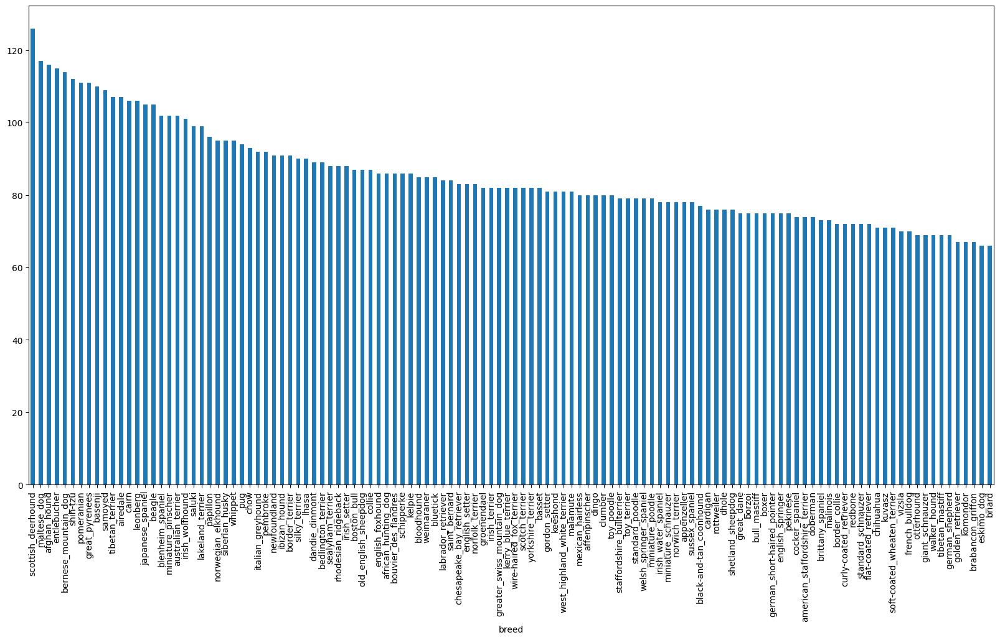

In [ ]:
# How many images are there per breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
# It is optimal to have 100 datapoints per label, minimum 10
labels_csv["breed"].value_counts().median()

82.0

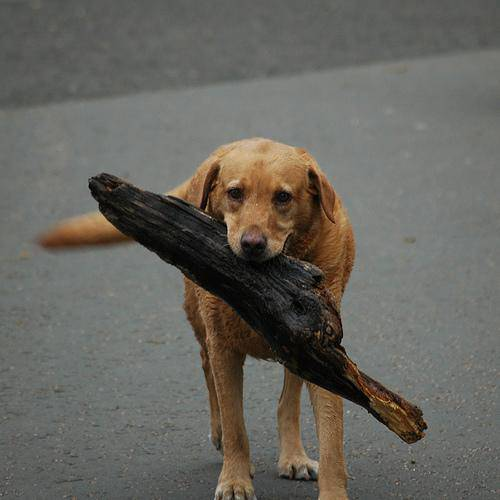

In [ ]:
# Let´s view an image
from IPython.display import Image

# Display the image using the Image class
display(Image(filename="/content/drive/MyDrive/Dog vision/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg"))

### Getting images and their labels

Let´s get a list of the images and the labels

In [ ]:
filenames = ["/content/drive/MyDrive/Dog vision/data/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# get the first 10
filenames[:10]

['/content/drive/MyDrive/Dog vision/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog vision/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog vision/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog vision/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog vision/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog vision/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog vision/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog vision/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog vision/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# boolean labels
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Create our own validation set



In [ ]:
# Set up X and y variables

X = filenames
y = boolean_labels

In [ ]:
NUM_IMAGES = 1000 # @param {type: "slider", min: 1000, max: 10000, step: 1000}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog vision/data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog vision/data/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog vision/data/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog vision/data/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog vision/data/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fa

### Preprocess Images

Turn images into tensors

In [ ]:
# convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# min and max values of the rgb values in the image
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# turn image numpy array into tensor
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# turn all images into tensors with rgb data

IMAGE_SIZE = 224

def preprocess_image(image_path):
  """
  Takes image file path and turns it into a tensor
  """
  # read image file
  image = tf.io.read_file(image_path)
  # turn jpeg into numerical values
  image = tf.image.decode_jpeg(image, channels=3)
  # normalize the values 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # rezise the image to (224, 224)
  image = tf.image.resize(image, size=[IMAGE_SIZE, IMAGE_SIZE])

  return image

In [ ]:
# Turning data into batches. We need the data in the format of `(images, labels)`. Then the images need to be batched in sizes of 32.

def get_image_label(image_path, label):
  image = preprocess_image(image_path)
  return image, label

In [ ]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  # shuffle data if training data, not shuffle if validation data

  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths, no labels
    data_batch = data.map(preprocess_image).batch(batch_size)
    return data_batch

  if valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) # filepaths and labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) # filepaths and labels
    # shuffle pathnames and labels
    data = data.shuffle(buffer_size=len(X))

    data = data.map(get_image_label)
    data_batch = data.batch(batch_size)

  return data_batch

In [ ]:
# Create training and validation data

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualize our data batches


In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(12, 12))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    # image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn off grid lines
    plt.axis("off")


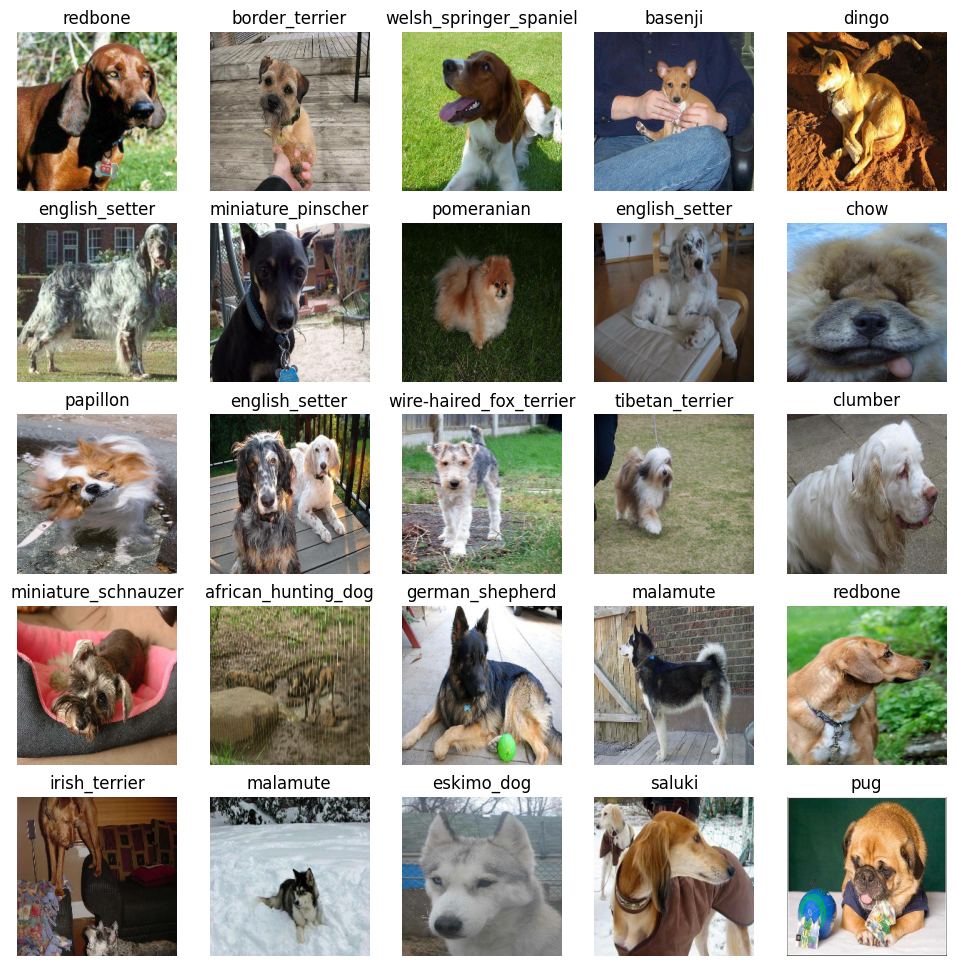

In [ ]:
# fetch first batch from batched training data and visualize
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

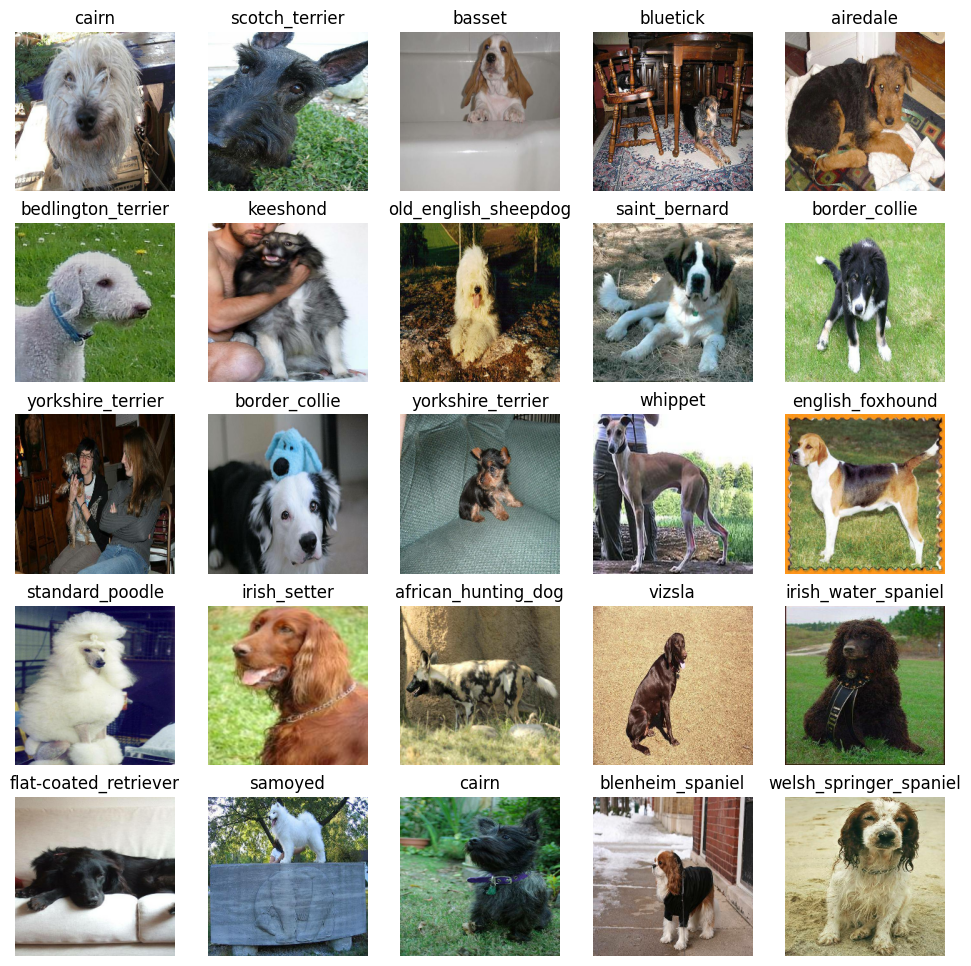

In [ ]:
# fetch first batch from batched training data and visualize
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Building a model

* define input in terms of tensor shape
* define outup in terms of tensor shape
* define the model in terms of URL to the model

In [ ]:
IMAGE_SIZE

224

In [ ]:
INPUT_SHAPE = [None, IMAGE_SIZE, IMAGE_SIZE, 3]

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print(f"Building a model with {model_url}")
  model = tf.keras.Sequential([
    hub.KerasLayer(model_url), # layer 1 pretrained model
    tf.keras.layers.Dense(units=output_shape, activation="softmax") # layer 2 dense NN, untrained
  ])
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  model.build(input_shape)
  return model


In [ ]:
model = create_model()
model.summary()

Building a model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Setup callbacks

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime
import os

def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Dog vision/logs", datetime.datetime.now().strftime("Y%m%d-H%M%s"))
  return tf.keras.callbacks.TensorBoard(logdir)


In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Train our model (on subset of data)

train on subset to test before we use the entire dataset (1000 images)

In [ ]:
NUM_EPOCHS = 100 # @param {type: "slider", min:10, max:100, step:10}

In [ ]:
# check to make sure we are running on a GPU
print("GPU available!!" if tf.config.list_physical_devices("GPU")  else "GPU not available")

GPU available!!


In [ ]:
def train_model():
  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
model = train_model()

Building a model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 214s 8s/step - loss: 4.6486 - accuracy: 0.1050 - val_loss: 3.4351 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 4s 161ms/step - loss: 1.6544 - accuracy: 0.6988 - val_loss: 2.1143 - val_accuracy: 0.5550
Epoch 3/100
25/25 [==============================] - 4s 179ms/step - loss: 0.5759 - accuracy: 0.9362 - val_loss: 1.6592 - val_accuracy: 0.6300
Epoch 4/100
25/25 [==============================] - 5s 200ms/step - loss: 0.2567 - accuracy: 0.9837 - val_loss: 1.4635 - val_accuracy: 0.6650
Epoch 5/100
25/25 [==============================] - 4s 160ms/step - loss: 0.1507 - accuracy: 0.9962 - val_loss: 1.3995 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 5s 181ms/step - loss: 0.1026 - accuracy: 1.0000 - val_loss: 1.3538 - val_accuracy: 0.6650
Epoch 7/100
25/25 [===============

### Tensorboard view

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ vision/logs

<IPython.core.display.Javascript object>

## Making predictions and evaluating the model

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 150ms/step


array([[7.0804422e-04, 2.2645848e-04, 1.9616121e-03, ..., 1.2298193e-04,
        2.2118165e-05, 2.3540468e-03],
       [9.0492121e-04, 4.7809197e-04, 2.1881873e-03, ..., 1.0580645e-03,
        1.0398059e-02, 1.4189766e-04],
       [7.1945819e-06, 4.0800296e-05, 1.4585995e-05, ..., 4.7676320e-05,
        2.2302393e-05, 1.3032564e-03],
       ...,
       [1.0009939e-05, 4.7288704e-04, 3.3924397e-04, ..., 3.3684526e-05,
        2.3283188e-04, 2.6985761e-04],
       [1.5500137e-03, 1.3523914e-04, 2.0629099e-04, ..., 7.2188719e-05,
        3.1580104e-05, 2.3636112e-03],
       [1.1507947e-03, 3.0016247e-04, 1.4745503e-03, ..., 1.4760137e-03,
        8.0922700e-04, 5.7955465e-05]], dtype=float32)

In [ ]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[0])

In [ ]:
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [ ]:
val_images, val_labels = unbatchify(val_data)

### Visualize the prediction

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("predicted: {}. Confidence: {:2.0f}%. Actual breed: {}".format(pred_label, np.max(pred_prob)*100, true_label), color=color)

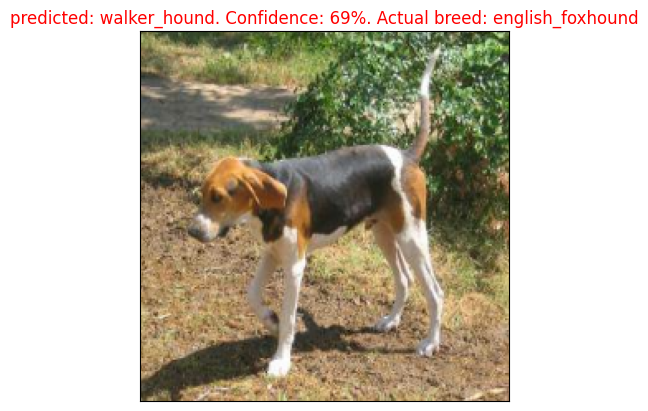

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=42)

#for n in range(len(val_images)):
#  plot_pred(prediction_probabilities=predictions, val_labels, val_images, n=n)

### Visualze top 10 predictions by confidence

top_10_pred_indexes:  [33, 71, 93, 108, 16, 101, 52, 7, 5, 54]
pred_prob:  <class 'numpy.ndarray'>
top_10_pred_values:  [0.6231575  0.10822096 0.0417126  0.03112524 0.02703172 0.01877449
 0.01501159 0.01292797 0.01285666 0.01233334]
labels:  <class 'list'>
top_10_pred_labels:  ['mexican_hairless' 'newfoundland' 'walker_hound' 'borzoi' 'irish_setter'
 'bernese_mountain_dog' 'norfolk_terrier' 'old_english_sheepdog'
 'bedlington_terrier' 'bedlington_terrier']


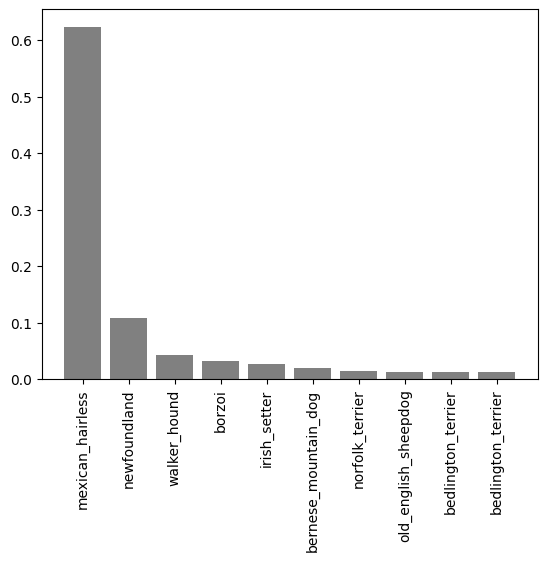

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = list(pred_prob.argsort()[-10:][::-1])
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = np.array(labels)[top_10_pred_indexes]


  # plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                        top_10_pred_values,
                        color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), top_10_pred_labels, rotation="vertical")

  # change color if correct prediction
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)



### Visualize for evaluation

top_10_pred_indexes:  [26, 17, 100, 59, 6, 102, 73, 35, 70, 103]
pred_prob:  <class 'numpy.ndarray'>
top_10_pred_values:  [0.31891134 0.24379762 0.08353362 0.07565026 0.04272712 0.03516329
 0.03367928 0.03132495 0.02597983 0.01999758]
labels:  <class 'list'>
top_10_pred_labels:  ['komondor' 'african_hunting_dog' 'bloodhound' 'labrador_retriever'
 'keeshond' 'wire-haired_fox_terrier' 'papillon' 'siberian_husky'
 'mexican_hairless' 'appenzeller']
top_10_pred_indexes:  [96, 48, 106, 77, 116, 26, 57, 74, 118, 104]
pred_prob:  <class 'numpy.ndarray'>
top_10_pred_values:  [0.566221   0.09984931 0.08691639 0.04775868 0.03583883 0.03238252
 0.0275877  0.02537574 0.01039806 0.0056708 ]
labels:  <class 'list'>
top_10_pred_labels:  ['collie' 'miniature_poodle' 'silky_terrier' 'groenendael'
 'staffordshire_bullterrier' 'komondor' 'shetland_sheepdog'
 'chesapeake_bay_retriever' 'pekinese' 'chihuahua']
top_10_pred_indexes:  [8, 14, 89, 13, 24, 93, 9, 86, 40, 119]
pred_prob:  <class 'numpy.ndarray'>


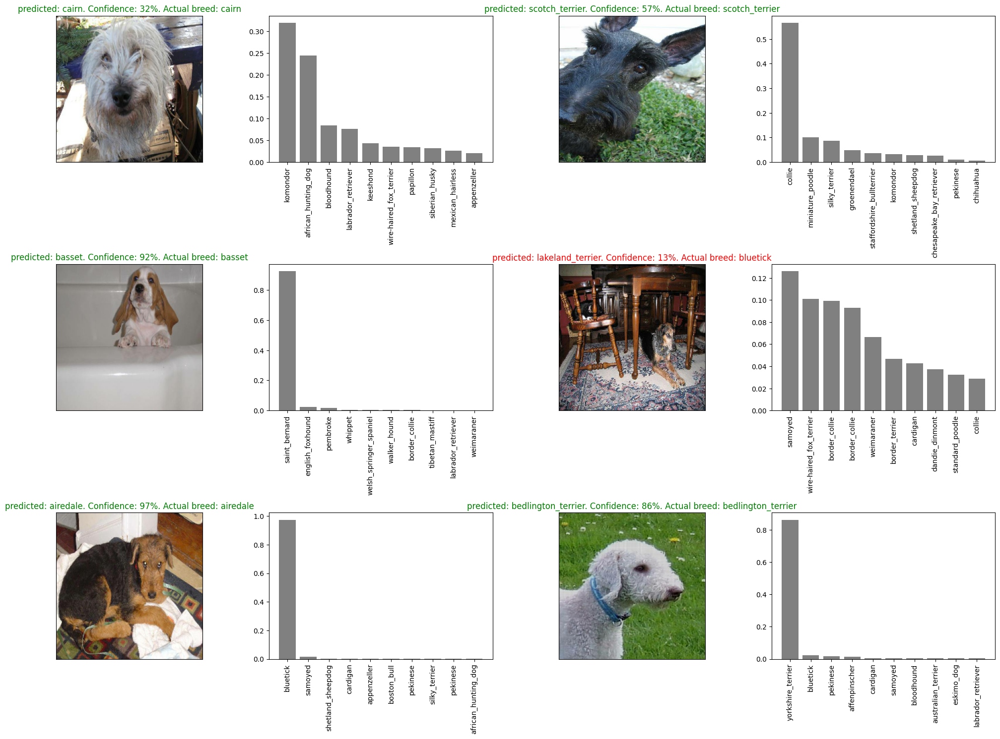

In [ ]:
i_multitplier = 0 # where in the dataset to start plot the next 6 images in a grid of 3*2
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=i+i_multitplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i+i_multitplier)

plt.tight_layout(h_pad=1.0)
plt.show()

#### challenge: create a confusion matrix for seeing where the model gets confused

### Saving and loading the trained model

In [ ]:
def save_model(model, suffix=None):
  modeldir = os.path.join("/content/drive/MyDrive/Dog vision/models", datetime.datetime.now().strftime("Y%m%d-H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"  # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# save model

model_1000_images_saved_path = save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog vision/models/Y0524-H311716586278-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# load model

loaded_1000_images_model = load_model(model_1000_images_saved_path)

In [ ]:
# evaluate mode pre saving

model.evaluate(val_data)

7/7 [==============================] - 1s 104ms/step - loss: 1.2704 - accuracy: 0.6800


[1.2703852653503418, 0.6800000071525574]

In [ ]:
# evaluate mode after saving

loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 120ms/step - loss: 1.2704 - accuracy: 0.6800


[1.2703852653503418, 0.6800000071525574]

## Train the big dog model on full dataset 🐶

In [ ]:
# length of original dataset

len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with full data set

full_data = create_data_batches(X, y)
full_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building a model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callbacks

full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on full data, so we can´t monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note:** Running this cell below might take 30 minutes for the first epoch

In [ ]:
# Train full model
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1718s 5s/step - loss: 1.3501 - accuracy: 0.6697
Epoch 2/100
320/320 [==============================] - 42s 131ms/step - loss: 0.4058 - accuracy: 0.8792
Epoch 3/100
320/320 [==============================] - 42s 132ms/step - loss: 0.2400 - accuracy: 0.9333
Epoch 4/100
320/320 [==============================] - 41s 129ms/step - loss: 0.1541 - accuracy: 0.9629
Epoch 5/100
320/320 [==============================] - 41s 129ms/step - loss: 0.1060 - accuracy: 0.9786
Epoch 6/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0783 - accuracy: 0.9860
Epoch 7/100
320/320 [==============================] - 41s 126ms/step - loss: 0.0569 - accuracy: 0.9931
Epoch 8/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0466 - accuracy: 0.9937
Epoch 9/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0366 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 42s 130ms

In [ ]:
# Save the trained model
model_id_suffix = "full-image-set-mobilenetv2-Adam"
full_model_saved_path = save_model(full_model, suffix=model_id_suffix)

Saving model to: /content/drive/MyDrive/Dog vision/models/Y0524-H161716588975-full-image-set-mobilenetv2-Adam.h5...


In [ ]:
# Load the trained model
full_model_saved_path = "/content/drive/MyDrive/Dog vision/models/Y0524-H311716586278-1000-images-mobilenetv2-Adam.h5"
loaded_full_model = load_model(full_model_saved_path)

### Make predictions on the test data set

In [ ]:
# get test data filenames
import os
test_path = "/content/drive/MyDrive/Dog vision/data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
# create batches of test data in correct format from filenames
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
# run predictions
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 894s 3s/step


In [ ]:
# save predictions
test_predictions_saved_path = f"/content/drive/MyDrive/Dog vision/predictions/{model_id_suffix}.csv"
np.savetxt(test_predictions_saved_path, test_predictions, delimiter=",")

In [ ]:
# load predictions from file
loaded_test_predictions = np.loadtxt(test_predictions_saved_path, delimiter=",")
loaded_test_predictions

array([[8.12673196e-03, 1.13765265e-04, 2.75150145e-04, ...,
        1.44368690e-03, 1.54623758e-05, 1.39338279e-03],
       [5.67517534e-04, 2.87561305e-03, 8.95145116e-04, ...,
        1.77139435e-02, 1.50134991e-04, 1.24272716e-04],
       [5.98839251e-04, 3.86915589e-03, 1.24968705e-04, ...,
        5.66571471e-05, 1.06453039e-02, 5.34587743e-05],
       ...,
       [4.90686252e-05, 7.98585170e-05, 1.02670994e-04, ...,
        8.49167409e-05, 7.60219555e-05, 1.30340530e-04],
       [1.35580823e-03, 1.45991115e-04, 1.66099344e-04, ...,
        1.76348235e-03, 2.13388284e-03, 4.69820388e-03],
       [2.60148408e-05, 7.98588095e-04, 2.35875632e-04, ...,
        1.08825279e-05, 1.74921661e-04, 9.77802210e-06]])

### Convert predictions to kaggle format for submission

Format should like like this in a csv:
```
id,affenpinscher,afghan_hound,..,yorkshire_terrier
000621fb3cbb32d8935728e48679680e,0.0083,0.0,...,0.0083
etc.
```

In [ ]:
# create dataframe headers
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))

In [ ]:
# append image ids to the id column
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
# append test predictions for each image to each breed column
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
# save df as csv
submission_filename = "full_model_predictions_submission_1_mobilenetv2.csv"
preds_df.to_csv("/content/drive/MyDrive/Dog vision/kaggle-submissions/" + submission_filename, index=False)

## Making predctions on custom images

In [84]:
custom_path = "/content/drive/MyDrive/Dog vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [85]:
# turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [86]:
# make predictions on custom data using the trained full model
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [87]:
custom_preds.shape

(10, 120)

In [88]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['siberian_husky',
 'chihuahua',
 'doberman',
 'african_hunting_dog',
 'walker_hound',
 'toy_terrier',
 'chihuahua',
 'samoyed',
 'walker_hound',
 'chow']

In [89]:
custom_images = []
for image in custom_data.unbatch():
    custom_images.append(image.numpy())

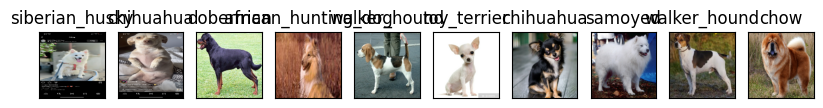

In [90]:
# plot the predictions. Need to fix method above to also be able to plot without labels
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, len(custom_images), i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)